# Lab 3

We will continue working with the [SUSY](https://archive.ics.uci.edu/ml/datasets/SUSY) and
[Higgs](https://archive.ics.uci.edu/ml/datasets/HIGGS) datasets in this lab and building some functions that would be useful to investigate any data. You will be making a lot of plots, separately for Higgs and SUSY datasets. Therefore use three separate notebooks and a python module:

* Copy of this lab where you work out the problems and make representative plots testing your code.
* A python module where you copy and paste the functions developed in this lab.
* Separate notebook containing plots, tables, and comments for
    * SUSY Dataset
    * Higgs Dataset

Make an effort to put in text boxes and organize your output so it is readable and well formatted. The goal of the SUSY/Higgs dataset is to present your analysis of the data, including your observations and motivation for your choices.

## Correlation

### Exercise 1

#### Part a
Write a function that creates pair plots and use it to compare variables in the SUSY and Higgs samples, separately for low and high-level features. Refer to [Data 1401 Visualization Lecture](https://github.com/UTA-DataScience/DATA1401.2020.Fall/blob/master/Lectures/Lecture.36/Lecture.36.ipynb) for details. Do not use `seaborn`.

#### Part b
Making these plots can be slow because creating each plot initiates a full loop over the data. Make at least one modification to your function in part a to speed it up. Can you propose a different method of creating histograms that would speed up making such pair plots?

#### Part c
Which observables appear to be best for separating signal from background?

In [1]:
filename="../../../Data/SUSY.csv"
!head -5  ../../../Data/SUSY.csv

0.000000000000000000e+00,9.728614687919616699e-01,6.538545489311218262e-01,1.176224589347839355e+00,1.157156467437744141e+00,-1.739873170852661133e+00,-8.743090629577636719e-01,5.677649974822998047e-01,-1.750000417232513428e-01,8.100607395172119141e-01,-2.525521218776702881e-01,1.921887040138244629e+00,8.896374106407165527e-01,4.107718467712402344e-01,1.145620822906494141e+00,1.932632088661193848e+00,9.944640994071960449e-01,1.367815494537353516e+00,4.071449860930442810e-02
1.000000000000000000e+00,1.667973041534423828e+00,6.419061869382858276e-02,-1.225171446800231934e+00,5.061022043228149414e-01,-3.389389812946319580e-01,1.672542810440063477e+00,3.475464344024658203e+00,-1.219136357307434082e+00,1.295456290245056152e-02,3.775173664093017578e+00,1.045977115631103516e+00,5.680512785911560059e-01,4.819284379482269287e-01,0.000000000000000000e+00,4.484102725982666016e-01,2.053557634353637695e-01,1.321893453598022461e+00,3.775840103626251221e-01
1.000000000000000000e+00,4.4483992457389831

In [2]:
VarNames=["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

In [3]:
RawNames=["l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi"]
FeatureNames=list(set(VarNames[1:]).difference(RawNames))

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
df = pd.read_csv(filename, dtype='float64', names=VarNames)

In [6]:
df

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0,0.0,0.972861,0.653855,1.176225,1.157156,-1.739873,-0.874309,0.567765,-0.175000,0.810061,-0.252552,1.921887,0.889637,0.410772,1.145621,1.932632,0.994464,1.367815,0.040714
1,1.0,1.667973,0.064191,-1.225171,0.506102,-0.338939,1.672543,3.475464,-1.219136,0.012955,3.775174,1.045977,0.568051,0.481928,0.000000,0.448410,0.205356,1.321893,0.377584
2,1.0,0.444840,-0.134298,-0.709972,0.451719,-1.613871,-0.768661,1.219918,0.504026,1.831248,-0.431385,0.526283,0.941514,1.587535,2.024308,0.603498,1.562374,1.135454,0.180910
3,1.0,0.381256,-0.976145,0.693152,0.448959,0.891753,-0.677328,2.033060,1.533041,3.046260,-1.005285,0.569386,1.015211,1.582217,1.551914,0.761215,1.715464,1.492257,0.090719
4,1.0,1.309996,-0.690089,-0.676259,1.589283,-0.693326,0.622907,1.087562,-0.381742,0.589204,1.365479,1.179295,0.968218,0.728563,0.000000,1.083158,0.043429,1.154854,0.094859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4999995,1.0,0.853325,-0.961783,-1.487277,0.678190,0.493580,1.647969,1.843867,0.276954,1.025105,-1.486535,0.892879,1.684429,1.674084,3.366298,1.046707,2.646649,1.389226,0.364599
4999996,0.0,0.951581,0.139370,1.436884,0.880440,-0.351948,-0.740852,0.290863,-0.732360,0.001360,0.257738,0.802871,0.545319,0.602730,0.002998,0.748959,0.401166,0.443471,0.239953
4999997,0.0,0.840389,1.419162,-1.218766,1.195631,1.695645,0.663756,0.490888,-0.509186,0.704289,0.045744,0.825015,0.723530,0.778236,0.752942,0.838953,0.614048,1.210595,0.026692
4999998,1.0,1.784218,-0.833565,-0.560091,0.953342,-0.688969,-1.428233,2.660703,-0.861344,2.116892,2.906151,1.232334,0.952444,0.685846,0.000000,0.781874,0.676003,1.197807,0.093689


In [151]:
abc = [[1, 2, 3], [4, 5, 6], [7, 8, 9]]

In [156]:
pd.DataFrame(abc, ['a', 'b', 'c'])

,0,1,2
a,1,2,3
b,4,5,6
c,7,8,9


In [8]:
dft = df[['signal','l_1_pT','l_1_eta','l_1_phi','l_2_pT']].head(10)

In [8]:
dfa = df[["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]].head(400)

In [9]:
#met, axial met, MR, axial met vs mtr2, mdelta R

In [69]:
dfg = df[["signal", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]].head(200)

In [11]:
dfa

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0,0.0,0.972861,0.653855,1.176225,1.157156,-1.739873,-0.874309,0.567765,-0.175000,0.810061,-0.252552,1.921887,0.889637,0.410772,1.145621,1.932632,0.994464,1.367815,0.040714
1,1.0,1.667973,0.064191,-1.225171,0.506102,-0.338939,1.672543,3.475464,-1.219136,0.012955,3.775174,1.045977,0.568051,0.481928,0.000000,0.448410,0.205356,1.321893,0.377584
2,1.0,0.444840,-0.134298,-0.709972,0.451719,-1.613871,-0.768661,1.219918,0.504026,1.831248,-0.431385,0.526283,0.941514,1.587535,2.024308,0.603498,1.562374,1.135454,0.180910
3,1.0,0.381256,-0.976145,0.693152,0.448959,0.891753,-0.677328,2.033060,1.533041,3.046260,-1.005285,0.569386,1.015211,1.582217,1.551914,0.761215,1.715464,1.492257,0.090719
4,1.0,1.309996,-0.690089,-0.676259,1.589283,-0.693326,0.622907,1.087562,-0.381742,0.589204,1.365479,1.179295,0.968218,0.728563,0.000000,1.083158,0.043429,1.154854,0.094859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,1.0,0.918271,0.775386,0.006188,0.925662,-0.786302,-1.340219,0.939679,1.152415,1.410573,-0.530563,1.112723,1.095538,0.873691,1.654864,1.150327,1.360690,1.253335,0.102496
396,0.0,0.690196,-1.047589,1.351474,0.653298,-0.988359,-1.239446,0.458322,0.471098,0.687998,0.074823,0.564233,0.657589,1.034219,1.299867,0.487983,0.980601,0.566167,0.062258
397,0.0,0.489389,-0.117567,-1.069658,0.718992,1.814241,0.881512,0.144457,-0.323664,0.204656,0.211000,0.845854,0.310401,0.325642,0.380414,0.847502,0.284153,0.682380,0.000289
398,0.0,0.592121,-0.174524,0.681330,0.845062,-1.293680,1.485942,0.701179,-1.040464,1.052557,-0.246637,0.709872,0.880985,1.101300,1.686703,0.694203,1.283303,0.759040,0.176115


In [9]:
dft

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT
0,0.0,0.972861,0.653855,1.176225,1.157156
1,1.0,1.667973,0.064191,-1.225171,0.506102
2,1.0,0.444840,-0.134298,-0.709972,0.451719
3,1.0,0.381256,-0.976145,0.693152,0.448959
4,1.0,1.309996,-0.690089,-0.676259,1.589283
5,0.0,0.456398,1.099371,1.512453,0.751772
6,0.0,0.437818,-1.119883,-1.336823,0.502320
7,0.0,0.571656,0.205696,0.425950,0.578514
8,1.0,2.112812,0.742983,-0.330539,0.805253
9,0.0,1.001869,-0.471788,0.555614,1.233368


In [13]:
dft.loc[dft['signal'] == 1]

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT
1,1.0,1.667973,0.064191,-1.225171,0.506102
2,1.0,0.444840,-0.134298,-0.709972,0.451719
3,1.0,0.381256,-0.976145,0.693152,0.448959
4,1.0,1.309996,-0.690089,-0.676259,1.589283
8,1.0,2.112812,0.742983,-0.330539,0.805253


In [10]:
def alternatespace(x, y):
    group = list()
    for a in range(y):
        for b in range(x):
            group.append([b, a])
    return group

In [115]:
def pairplots(dataset, size = 60):
    a = len(dataset.columns)
    fig, axs = plt.subplots(a-1, a-1, figsize=(size, size))
    for c, t in enumerate(alternatespace(a, a)):
        if dataset.columns[t[0]] == 'signal':
            pass
        elif dataset.columns[t[1]] == 'signal':
            pass
        else:
            if t[0] == t[1]:
                axs[t[0]-1][t[1]-1].hist(dataset.loc[dataset['signal'] == 0][dataset.columns[[t[0]]]], color ='tab:blue', histtype = 'step')
                axs[t[0]-1][t[1]-1].hist(dataset.loc[dataset['signal'] == 1][dataset.columns[[t[0]]]], color ='tab:orange', histtype = 'step')
                axs[t[0]-1][t[1]-1].title.set_text(dataset.columns[t[0]]+' vs. '+dataset.columns[t[1]])
            else:
                if t[0]>t[1]:
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 0][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 0][dataset.columns[t[1]]], color ='tab:blue')
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 1][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 1][dataset.columns[t[1]]], color ='tab:orange')
                    axs[t[0]-1][t[1]-1].title.set_text(dataset.columns[t[0]]+' vs. '+dataset.columns[t[1]])
                if t[0]<t[1]:
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 1][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 1][dataset.columns[t[1]]], color ='tab:orange')
                    axs[t[0]-1][t[1]-1].scatter(dataset.loc[dataset['signal'] == 0][dataset.columns[[t[0]]]],dataset.loc[dataset['signal'] == 0][dataset.columns[t[1]]], color ='tab:blue')
                    axs[t[0]-1][t[1]-1].title.set_text(dataset.columns[t[0]]+' vs. '+dataset.columns[t[1]])

In [12]:
alternatespace(2, 9)

[[0, 0],
 [1, 0],
 [0, 1],
 [1, 1],
 [0, 2],
 [1, 2],
 [0, 3],
 [1, 3],
 [0, 4],
 [1, 4],
 [0, 5],
 [1, 5],
 [0, 6],
 [1, 6],
 [0, 7],
 [1, 7],
 [0, 8],
 [1, 8]]

In [17]:
dft.columns.tolist()

['signal', 'l_1_pT', 'l_1_eta', 'l_1_phi', 'l_2_pT']

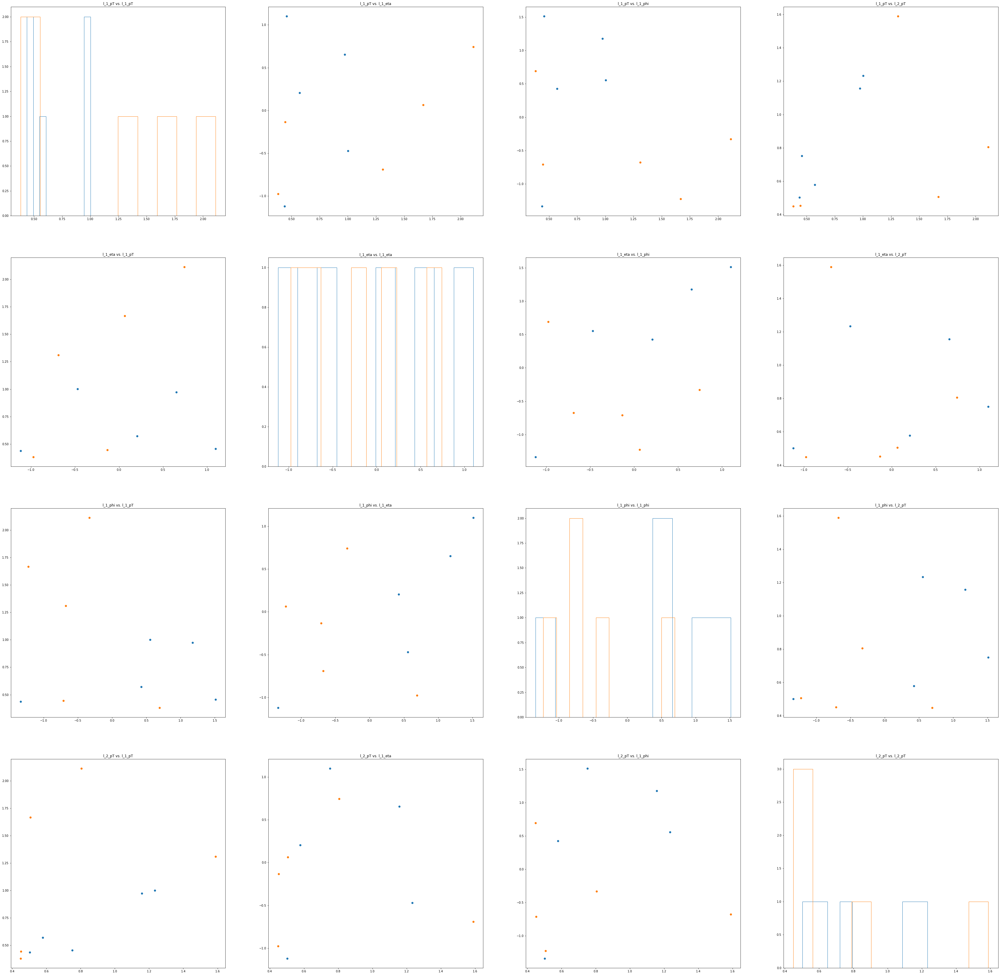

In [116]:
pairplots(dft)

In [19]:
pairplots(dfa, 200)

In [117]:
pairplots(dfg, 200)

In [21]:
#visualization lecture 36 https://github.com/UTA-DataScience/DATA1401.2020.Fall/blob/master/Lectures/Lecture.36/Lecture.36.ipynb

### Exercise 2

#### Part a
Install [tabulate](https://github.com/astanin/python-tabulate). 

#### Part b
Use numpy to compute the [covariance matrix](https://numpy.org/doc/stable/reference/generated/numpy.cov.html) and [correlation matrix](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html) between all observabes, and separately between low and high-level features.

#### Part c
Use tabulate to create a well formatted table of the covariance and correlation matrices, with nice headings and appropriate significant figures. Embed the table into this notebook.

#### Part d
Write a function that takes a dataset and appropriate arguments and performs steps b and c.  

In [47]:
import numpy as np

In [23]:
dft[dft.columns.tolist()]

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT
0,0.0,0.972861,0.653855,1.176225,1.157156
1,1.0,1.667973,0.064191,-1.225171,0.506102
2,1.0,0.444840,-0.134298,-0.709972,0.451719
3,1.0,0.381256,-0.976145,0.693152,0.448959
4,1.0,1.309996,-0.690089,-0.676259,1.589283
5,0.0,0.456398,1.099371,1.512453,0.751772
6,0.0,0.437818,-1.119883,-1.336823,0.502320
7,0.0,0.571656,0.205696,0.425950,0.578514
8,1.0,2.112812,0.742983,-0.330539,0.805253
9,0.0,1.001869,-0.471788,0.555614,1.233368


In [24]:
np.rot90(dft)

array([[ 1.15715647,  0.5061022 ,  0.45171893,  0.44895884,  1.58928263,
         0.75177199,  0.50231993,  0.57851398,  0.80525309,  1.23336756],
       [ 1.17622459, -1.22517145, -0.70997161,  0.69315231, -0.67625928,
         1.51245344, -1.33682251,  0.42594951, -0.33053902,  0.55561364],
       [ 0.65385455,  0.06419062, -0.13429801, -0.97614539, -0.69008946,
         1.09937119, -1.1198827 ,  0.20569578,  0.74298292, -0.4717876 ],
       [ 0.97286147,  1.66797304,  0.44483992,  0.38125607,  1.30999649,
         0.45639819,  0.43781763,  0.57165623,  2.1128118 ,  1.00186861],
       [ 0.        ,  1.        ,  1.        ,  1.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  1.        ,  0.        ]])

In [25]:
np.cov(np.rot90(dft))

array([[ 0.15657823,  0.07998433,  0.01057684,  0.08287648, -0.02343412],
       [ 0.07998433,  0.99996499,  0.36898616, -0.18990172, -0.25456709],
       [ 0.01057684,  0.36898616,  0.56880406,  0.13547645, -0.07558947],
       [ 0.08287648, -0.18990172,  0.13547645,  0.3584633 ,  0.13757084],
       [-0.02343412, -0.25456709, -0.07558947,  0.13757084,  0.27777778]])

In [26]:
np.cov(np.rot90(dft.loc[dft['signal'] == 0]))

array([[0.11135155, 0.19685274, 0.06186738, 0.08728656, 0.        ],
       [0.19685274, 1.21482127, 0.89575154, 0.11094391, 0.        ],
       [0.06186738, 0.89575154, 0.78204992, 0.00994039, 0.        ],
       [0.08728656, 0.11094391, 0.00994039, 0.07735649, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])

In [27]:
np.cov(dft.loc[dft['signal'] == 0])

array([[ 0.2400067 ,  0.19655844, -0.02407356,  0.11246211,  0.22754557],
       [ 0.19655844,  0.3377802 , -0.37923581,  0.05121827, -0.01640721],
       [-0.02407356, -0.37923581,  0.75631145,  0.07038875,  0.38679344],
       [ 0.11246211,  0.05121827,  0.07038875,  0.06255993,  0.14985881],
       [ 0.22754557, -0.01640721,  0.38679344,  0.14985881,  0.4951541 ]])

In [28]:
np.corrcoef(dft)

array([[ 1.        , -0.36834651, -0.62641138, -0.10626765, -0.0642706 ,
         0.69033981, -0.05650387,  0.91779657, -0.20284072,  0.6600647 ],
       [-0.36834651,  1.        ,  0.84833054,  0.09947679,  0.78009959,
        -0.86156523,  0.83538186,  0.01860206,  0.96251433,  0.21249355],
       [-0.62641138,  0.84833054,  1.        ,  0.34642831,  0.81091708,
        -0.97763483,  0.81089886, -0.2901873 ,  0.67312947,  0.09999915],
       [-0.10626765,  0.09947679,  0.34642831,  1.        ,  0.48697249,
        -0.39432076,  0.38969958,  0.02735898, -0.04829123,  0.49823283],
       [-0.0642706 ,  0.78009959,  0.81091708,  0.48697249,  1.        ,
        -0.74833284,  0.99216629,  0.3033517 ,  0.66686576,  0.65780567],
       [ 0.69033981, -0.86156523, -0.97763483, -0.39432076, -0.74833284,
         1.        , -0.75031204,  0.3523382 , -0.70359208, -0.04011877],
       [-0.05650387,  0.83538186,  0.81089886,  0.38969958,  0.99216629,
        -0.75031204,  1.        ,  0.32359721

In [29]:
np.corrcoef(dft.loc[dft['signal'] == 1])

array([[ 1.        ,  0.84833054,  0.09947679,  0.78009959,  0.96251433],
       [ 0.84833054,  1.        ,  0.34642831,  0.81091708,  0.67312947],
       [ 0.09947679,  0.34642831,  1.        ,  0.48697249, -0.04829123],
       [ 0.78009959,  0.81091708,  0.48697249,  1.        ,  0.66686576],
       [ 0.96251433,  0.67312947, -0.04829123,  0.66686576,  1.        ]])

In [30]:
np.corrcoef(dft.loc[dft['signal'] == 0])

array([[ 1.        ,  0.69033981, -0.05650387,  0.91779657,  0.6600647 ],
       [ 0.69033981,  1.        , -0.75031204,  0.3523382 , -0.04011877],
       [-0.05650387, -0.75031204,  1.        ,  0.32359721,  0.63206038],
       [ 0.91779657,  0.3523382 ,  0.32359721,  1.        ,  0.85145946],
       [ 0.6600647 , -0.04011877,  0.63206038,  0.85145946,  1.        ]])

Hint: Example code for embedding a `tabulate` table into a notebook:

In [118]:
from IPython.display import HTML, display
import tabulate
table = [["A",1,2],
        ["C",3,4],
        ["D",5,6]]
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=["X","Y","Z"])))

X,Y,Z
A,1,2
C,3,4
D,5,6


In [32]:
table = np.corrcoef(np.cov(np.rot90(dft.loc[dft['signal'] == 0].iloc[:, [1,2,3,4]])))
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=['signal','l_1_pT','l_1_eta','l_1_phi','l_2_pT'])))

signal,l_1_pT,l_1_eta,l_1_phi
1,0.525278,0.395398,0.824559
0.525278,1,0.989275,-0.0455422
0.395398,0.989275,1,-0.19088
0.824559,-0.0455422,-0.19088,1


In [33]:
dft.loc[dft['signal'] == 0].iloc[:, 1:]

,l_1_pT,l_1_eta,l_1_phi,l_2_pT
0,0.972861,0.653855,1.176225,1.157156
5,0.456398,1.099371,1.512453,0.751772
6,0.437818,-1.119883,-1.336823,0.502320
7,0.571656,0.205696,0.425950,0.578514
9,1.001869,-0.471788,0.555614,1.233368


In [34]:
table = np.corrcoef(np.rot90(dft)).tolist()
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=['signal','l_1_pT','l_1_eta','l_1_phi','l_2_pT'])))

signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT
1,0.202137,0.0354412,0.349819,-0.112366
0.202137,1,0.489256,-0.317186,-0.483016
0.0354412,0.489256,1,0.300027,-0.190165
0.349819,-0.317186,0.300027,1,0.435969
-0.112366,-0.483016,-0.190165,0.435969,1


In [36]:
tlis = [' ']
np.corrcoef(np.rot90(dft)).tolist()

[[1.0,
  0.2021374834998753,
  0.03544123075263188,
  0.34981889280001033,
  -0.11236583709760603],
 [0.20213748349987531,
  1.0,
  0.4892562003859714,
  -0.3171861002391089,
  -0.4830155573368994],
 [0.03544123075263188,
  0.48925620038597145,
  1.0,
  0.3000268431935489,
  -0.19016528218265302],
 [0.34981889280001033,
  -0.3171861002391089,
  0.3000268431935489,
  1.0,
  0.43596869266449584],
 [-0.11236583709760604,
  -0.4830155573368994,
  -0.19016528218265305,
  0.43596869266449584,
  1.0]]

In [119]:
def tab_everything(dataframe):
    seperate_matricies = [dataframe.iloc[:, 1:], dataframe.loc[dataframe['signal'] == 0].iloc[:, 1:], dataframe.loc[dataframe['signal'] == 1].iloc[:, 1:]]
    mat_titles = ['Full Data', 'Signal 0', 'Signal 1']
    for n, mat in enumerate(seperate_matricies):
        print(mat_titles[n]+' Correlation Coeficent')
        head = mat.columns.tolist()
        table = np.corrcoef(np.rot90(mat)).tolist()
        for i, t in enumerate(table):
            t.insert(0, head[i])
        display(HTML(tabulate.tabulate(table, tablefmt='html', headers=head)))
        print(mat_titles[n]+' Covariance')
        table = np.cov(np.rot90(mat)).tolist()
        for i, t in enumerate(table):
            t.insert(0, head[i])
        display(HTML(tabulate.tabulate(table, tablefmt='html', headers=head)))

In [38]:
dft.loc[dft['signal'] == 0].iloc[:, 1:]

,l_1_pT,l_1_eta,l_1_phi,l_2_pT
0,0.972861,0.653855,1.176225,1.157156
5,0.456398,1.099371,1.512453,0.751772
6,0.437818,-1.119883,-1.336823,0.502320
7,0.571656,0.205696,0.425950,0.578514
9,1.001869,-0.471788,0.555614,1.233368


In [39]:
np.corrcoef(np.rot90(dft.loc[dft['signal'] == 0].iloc[:, 1:])).tolist()[0]

[1.0, 0.5352259161487489, 0.2096507159548545, 0.9404827737568501]

In [40]:
temp = np.corrcoef(np.rot90(dft.loc[dft['signal'] == 0].iloc[:, 1:])).tolist()[0]
temp.insert(0, 0)
temp

[0, 1.0, 0.5352259161487489, 0.2096507159548545, 0.9404827737568501]

In [41]:
tab_everything(dft)

Full Data Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT
l_1_pT,1,0.202137,0.0354412,0.349819
l_1_eta,0.202137,1,0.489256,-0.317186
l_1_phi,0.0354412,0.489256,1,0.300027
l_2_pT,0.349819,-0.317186,0.300027,1


Full Data Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT
l_1_pT,0.156578,0.0799843,0.0105768,0.0828765
l_1_eta,0.0799843,0.999965,0.368986,-0.189902
l_1_phi,0.0105768,0.368986,0.568804,0.135476
l_2_pT,0.0828765,-0.189902,0.135476,0.358463


Signal 0 Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT
l_1_pT,1,0.535226,0.209651,0.940483
l_1_eta,0.535226,1,0.918997,0.361909
l_1_phi,0.209651,0.918997,1,0.0404145
l_2_pT,0.940483,0.361909,0.0404145,1


Signal 0 Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT
l_1_pT,0.111352,0.196853,0.0618674,0.0872866
l_1_eta,0.196853,1.21482,0.895752,0.110944
l_1_phi,0.0618674,0.895752,0.78205,0.00994039
l_2_pT,0.0872866,0.110944,0.00994039,0.0773565


Signal 1 Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT
l_1_pT,1,-0.187727,-0.160414,0.339517
l_1_eta,-0.187727,1,-0.461308,-0.469618
l_1_phi,-0.160414,-0.461308,1,0.743501
l_2_pT,0.339517,-0.469618,0.743501,1


Signal 1 Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT
l_1_pT,0.236501,-0.065209,-0.0524176,0.125299
l_1_eta,-0.065209,0.510184,-0.221398,-0.254553
l_1_phi,-0.0524176,-0.221398,0.451478,0.379113
l_2_pT,0.125299,-0.254553,0.379113,0.575887


In [42]:
tab_everything(dfa)

Full Data Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,1,0.0852868,0.419801,-0.0985653,0.382402,0.675638,0.496068,-0.130975,-0.356903,0.396952,0.00658248,0.441609,0.0881737,-0.0126763,-0.263765,0.00772783,0.0120072,0.1885
l_1_eta,0.0852868,1,0.0748208,-0.0197088,0.0262535,0.363324,0.170599,-0.12406,-0.103156,0.331356,-0.00516428,0.374182,0.0609909,0.0165848,-0.0729383,-0.0395922,0.000736423,-0.229067
l_1_phi,0.419801,0.0748208,1,0.270007,0.887019,0.572776,0.718654,0.211655,-0.531807,0.80067,0.0397568,0.577709,0.0440431,-0.00881921,-0.00575544,0.00594659,-0.0421137,0.277672
l_2_pT,-0.0985653,-0.0197088,0.270007,1,0.052416,-0.33006,0.616772,0.977648,-0.145294,0.24354,0.04419,0.294841,-0.0461654,0.0167658,0.758346,-0.0112946,-0.10253,0.796649
l_2_eta,0.382402,0.0262535,0.887019,0.052416,1,0.624675,0.518499,-0.0105484,-0.595005,0.707095,0.0232822,0.336872,0.0278013,-0.0368061,-0.11764,0.0194638,-0.0157983,0.0670925
l_2_phi,0.675638,0.363324,0.572776,-0.33006,0.624675,1,0.389388,-0.42759,-0.461137,0.612127,0.0297975,0.436459,0.0726343,0.0149403,-0.390715,0.0140768,0.0349519,-0.187979
MET,0.496068,0.170599,0.718654,0.616772,0.518499,0.389388,1,0.556642,-0.489294,0.702463,0.0297987,0.694159,0.0404028,-0.00606809,0.336345,-0.0471523,-0.0621909,0.711617
MET_phi,-0.130975,-0.12406,0.211655,0.977648,-0.0105484,-0.42759,0.556642,1,-0.0202826,0.165254,0.0295243,0.274347,-0.0436425,0.0139759,0.763395,-0.0171374,-0.110536,0.841202
MET_rel,-0.356903,-0.103156,-0.531807,-0.145294,-0.595005,-0.461137,-0.489294,-0.0202826,1,-0.433041,-0.0405985,0.0495594,0.0495211,0.0551949,0.0517654,-0.0294007,0.0122837,-0.0827931
axial_MET,0.396952,0.331356,0.80067,0.24354,0.707095,0.612127,0.702463,0.165254,-0.433041,1,0.0340223,0.662224,0.0554569,0.0211191,-0.0178512,-0.0451969,-0.0229121,0.257903


Full Data Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,0.0398523,0.00736911,0.0503902,-0.0101561,0.0635335,0.0640581,0.0524631,-0.0138993,-0.0628977,0.0629467,0.00134305,0.060435,0.0177456,-0.00251506,-0.0293603,0.00153298,0.00226611,0.023342
l_1_eta,0.00736911,0.187333,0.0194718,-0.00440294,0.00945692,0.0746851,0.0391172,-0.0285441,-0.0394148,0.113923,-0.00228451,0.111023,0.0266131,0.0071342,-0.0176027,-0.0170282,0.000301332,-0.0614995
l_1_phi,0.0503902,0.0194718,0.361536,0.0837966,0.44388,0.163566,0.228919,0.0676525,-0.282286,0.382417,0.0244323,0.238127,0.026698,-0.0052703,-0.00192962,0.00355301,-0.0239393,0.103564
l_2_pT,-0.0101561,-0.00440294,0.0837966,0.26641,0.0225162,-0.0809099,0.16865,0.268248,-0.0662036,0.0998511,0.0233118,0.104325,-0.0240224,0.00860062,0.218253,-0.00579296,-0.0500309,0.255061
l_2_eta,0.0635335,0.00945692,0.44388,0.0225162,0.692648,0.246913,0.228608,-0.00466684,-0.437155,0.467458,0.0198042,0.192197,0.0233263,-0.0304443,-0.0545921,0.0160967,-0.0124302,0.0346364
l_2_phi,0.0640581,0.0746851,0.163566,-0.0809099,0.246913,0.225562,0.097972,-0.107954,-0.19334,0.230932,0.014464,0.142102,0.0347776,0.00705216,-0.103469,0.00664339,0.0156933,-0.055379
MET,0.0524631,0.0391172,0.228919,0.16865,0.228608,0.097972,0.280655,0.156762,-0.228831,0.295609,0.0161347,0.252098,0.0215785,-0.00319498,0.0993545,-0.0248223,-0.0311476,0.233848
MET_phi,-0.0138993,-0.0285441,0.0676525,0.268248,-0.00466684,-0.107954,0.156762,0.28259,-0.00951832,0.0697814,0.0160411,0.0999775,-0.023389,0.00738395,0.226279,-0.00905266,-0.0555511,0.277383
MET_rel,-0.0628977,-0.0394148,-0.282286,-0.0662036,-0.437155,-0.19334,-0.228831,-0.00951832,0.779323,-0.303666,-0.0366308,0.0299923,0.0440731,0.048427,0.0254809,-0.025791,0.0102518,-0.0453372
axial_MET,0.0629467,0.113923,0.382417,0.0998511,0.467458,0.230932,0.295609,0.0697814,-0.303666,0.630981,0.0276216,0.360609,0.0444108,0.016673,-0.00790665,-0.0356755,-0.0172062,0.127077


Signal 0 Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,1,0.133262,0.325487,-0.283746,0.31639,0.64941,0.426865,-0.305586,-0.442335,0.338502,-0.0713908,0.498338,0.0579625,0.0363614,-0.320492,0.0750664,0.00453993,0.0114642
l_1_eta,0.133262,1,0.119061,0.0564802,0.0771146,0.353532,0.360816,-0.0341415,-0.334504,0.424955,-0.027392,0.540719,0.096968,0.0571655,-0.101439,-0.0112416,0.0224352,-0.166792
l_1_phi,0.325487,0.119061,1,0.0857686,0.964401,0.625085,0.760037,0.0463834,-0.805634,0.836013,0.0423156,0.751184,0.0868691,-0.048386,-0.166102,0.0295285,-0.0205379,0.0516932
l_2_pT,-0.283746,0.0564802,0.0857686,1,0.00362732,-0.473099,0.381579,0.991532,-0.093836,0.0353059,0.0485115,0.0755762,-0.0514855,-0.065123,0.739479,0.0586273,-0.082346,0.753259
l_2_eta,0.31639,0.0771146,0.964401,0.00362732,1,0.651597,0.692613,-0.0317884,-0.766351,0.81708,0.0473166,0.681292,0.0960046,-0.0410405,-0.171532,0.0493532,0.00330489,0.000425286
l_2_phi,0.64941,0.353532,0.625085,-0.473099,0.651597,1,0.489522,-0.540181,-0.630266,0.690364,0.00619351,0.716633,0.0695088,0.0747275,-0.459777,0.0464693,0.0521316,-0.323897
MET,0.426865,0.360816,0.760037,0.381579,0.692613,0.489522,1,0.327789,-0.775434,0.744886,-0.0253759,0.85556,0.0896827,-0.0110107,0.167366,0.0761858,-0.016424,0.470611
MET_phi,-0.305586,-0.0341415,0.0463834,0.991532,-0.0317884,-0.540181,0.327789,1,-0.020584,-0.042936,0.0447362,-0.00577579,-0.0607615,-0.0774012,0.752734,0.0476703,-0.0913543,0.771923
MET_rel,-0.442335,-0.334504,-0.805634,-0.093836,-0.766351,-0.630266,-0.775434,-0.020584,1,-0.769128,0.0251417,-0.756679,-0.0600944,-0.031337,0.164435,-0.106152,-0.0127302,-0.077069
axial_MET,0.338502,0.424955,0.836013,0.0353059,0.81708,0.690364,0.744886,-0.042936,-0.769128,1,0.0414139,0.87981,0.117199,-0.0281793,-0.217531,0.0284341,0.0320192,-0.0305769


Signal 0 Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,0.030307,0.01017,0.0280244,-0.0215135,0.038577,0.0516021,0.0233485,-0.0230773,-0.0349915,0.0343369,-0.013081,0.0308824,0.00989706,0.00694872,-0.025272,0.0125858,0.000854419,0.000703381
l_1_eta,0.01017,0.192172,0.0258135,0.0107833,0.0236764,0.0707376,0.0496967,-0.00649243,-0.0666326,0.108547,-0.0126385,0.0843786,0.0416928,0.0275088,-0.0201419,-0.00474607,0.0106323,-0.0257689
l_1_phi,0.0280244,0.0258135,0.244603,0.0184744,0.334059,0.141106,0.118104,0.00995117,-0.181055,0.240919,0.0220272,0.132249,0.042139,-0.0262689,-0.0372097,0.0140649,-0.0109809,0.00901035
l_2_pT,-0.0215135,0.0107833,0.0184744,0.18968,0.00110645,-0.0940458,0.0522147,0.187326,-0.0185704,0.00895953,0.0222373,0.0117169,-0.0219929,-0.0311342,0.145877,0.0245908,-0.0387707,0.11562
l_2_eta,0.038577,0.0236764,0.334059,0.00110645,0.490532,0.2083,0.152413,-0.0096579,-0.243894,0.333446,0.0348798,0.169856,0.0659497,-0.0315528,-0.0544162,0.0332899,0.00250231,0.000104976
l_2_phi,0.0516021,0.0707376,0.141106,-0.0940458,0.2083,0.208331,0.0702014,-0.106954,-0.13072,0.183604,0.00297537,0.116436,0.0311174,0.0374411,-0.0950547,0.020427,0.0257233,-0.0521028
MET,0.0233485,0.0496967,0.118104,0.0522147,0.152413,0.0702014,0.0987175,0.0446757,-0.110709,0.136369,-0.00839162,0.0956892,0.0276371,-0.00379754,0.0238185,0.0230533,-0.00557862,0.0521118
MET_phi,-0.0230773,-0.00649243,0.00995117,0.187326,-0.0096579,-0.106954,0.0446757,0.188174,-0.00405743,-0.0108525,0.0204252,-0.000891882,-0.0258521,-0.036857,0.147901,0.0199154,-0.0428409,0.118013
MET_rel,-0.0349915,-0.0666326,-0.181055,-0.0185704,-0.243894,-0.13072,-0.110709,-0.00405743,0.206481,-0.203642,0.0120244,-0.122396,-0.0267832,-0.0156311,0.0338442,-0.046455,-0.00625355,-0.0123423
axial_MET,0.0343369,0.108547,0.240919,0.00895953,0.333446,0.183604,0.136369,-0.0108525,-0.203642,0.339512,0.0253981,0.182487,0.0669792,-0.0180239,-0.0574115,0.0159562,0.0201692,-0.0062791


Signal 1 Correlation Coeficent


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,1,0.0214647,0.416979,-0.100176,0.400729,0.698617,0.482252,-0.155725,-0.382771,0.367866,0.0572062,0.365738,0.0799894,-0.0914884,-0.330759,-0.0420171,0.0429783,0.157247
l_1_eta,0.0214647,1,0.012391,-0.124815,-0.0296858,0.368985,0.0611474,-0.25256,-0.0200445,0.277829,0.0159591,0.370997,0.0109665,-0.0493581,-0.0754697,-0.0690971,-0.030781,-0.364139
l_1_phi,0.416979,0.012391,1,0.2768,0.854046,0.535425,0.668346,0.186078,-0.529475,0.75537,0.0065561,0.449123,-0.0399988,0.00810539,-0.01525,-0.00179459,-0.0528335,0.238435
l_2_pT,-0.100176,-0.124815,0.2768,1,0.023789,-0.2994,0.670902,0.965053,-0.202843,0.249054,0.00920297,0.235137,-0.100209,0.0887447,0.751265,-0.0607086,-0.124686,0.814247
l_2_eta,0.400729,-0.0296858,0.854046,0.023789,1,0.602955,0.452723,-0.0664607,-0.587914,0.650732,-0.0117432,0.190475,-0.0476478,-0.0460992,-0.13459,0.000697174,-0.0307358,0.0249473
l_2_phi,0.698617,0.368985,0.535425,-0.2994,0.602955,1,0.355187,-0.443752,-0.458188,0.580416,0.045068,0.356137,0.0588919,-0.0746038,-0.400047,-0.0144263,0.0199699,-0.230959
MET,0.482252,0.0611474,0.668346,0.670902,0.452723,0.355187,1,0.577798,-0.519171,0.641596,0.0255639,0.557302,-0.0475884,-0.0383454,0.331508,-0.111293,-0.0953823,0.702954
MET_phi,-0.155725,-0.25256,0.186078,0.965053,-0.0664607,-0.443752,0.577798,1,-0.0434125,0.14747,-0.0178821,0.217256,-0.0903268,0.0909156,0.751211,-0.0600152,-0.133744,0.869368
MET_rel,-0.382771,-0.0200445,-0.529475,-0.202843,-0.587914,-0.458188,-0.519171,-0.0434125,1,-0.398822,-0.0829227,0.185221,0.0951586,0.115539,0.00782945,-0.000414147,0.0351621,-0.118001
axial_MET,0.367866,0.277829,0.75537,0.249054,0.650732,0.580416,0.641596,0.14747,-0.398822,1,-0.000153079,0.544697,-0.0304133,0.0477369,-0.0176224,-0.0902638,-0.0622116,0.224031


Signal 1 Covariance


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
l_1_pT,0.0466941,0.00197688,0.0589801,-0.0119696,0.0823827,0.0742681,0.0644766,-0.0194441,-0.0992423,0.0732388,0.0121739,0.0631162,0.0178439,-0.0170074,-0.0454978,-0.00935209,0.00707138,0.0252351
l_1_eta,0.00197688,0.181657,0.00345695,-0.0294157,-0.0120373,0.0773689,0.016125,-0.0621997,-0.0102506,0.1091,0.00669866,0.12628,0.00482527,-0.0180978,-0.020476,-0.0303345,-0.00998923,-0.115261
l_1_phi,0.0589801,0.00345695,0.42847,0.100187,0.531858,0.172421,0.270681,0.0703807,-0.415846,0.455554,0.0042263,0.234782,-0.0270293,0.00456431,-0.00635445,-0.00120997,-0.0263325,0.11591
l_2_pT,-0.0119696,-0.0294157,0.100187,0.305755,0.0125146,-0.081446,0.229532,0.308344,-0.134578,0.126882,0.00501153,0.103836,-0.0572032,0.0422153,0.26444,-0.0345771,-0.0524961,0.334375
l_2_eta,0.0823827,-0.0120373,0.531858,0.0125146,0.905125,0.282209,0.266492,-0.0365357,-0.671111,0.570395,-0.0110026,0.144721,-0.0467976,-0.0377302,-0.0815106,0.000683198,-0.022265,0.0176266
l_2_phi,0.0742681,0.0773689,0.172421,-0.081446,0.282209,0.242027,0.108115,-0.126145,-0.27046,0.263082,0.0218351,0.139922,0.0299098,-0.0315743,-0.125282,-0.00731032,0.00748051,-0.0843833
MET,0.0644766,0.016125,0.270681,0.229532,0.266492,0.108115,0.382819,0.206572,-0.385419,0.365744,0.0155768,0.275376,-0.0303965,-0.0204103,0.130568,-0.0709275,-0.0449353,0.323009
MET_phi,-0.0194441,-0.0621997,0.0703807,0.308344,-0.0365357,-0.126145,0.206572,0.333884,-0.0300981,0.0785093,-0.0101759,0.100255,-0.0538817,0.0451936,0.276316,-0.0357199,-0.0588432,0.373072
MET_rel,-0.0992423,-0.0102506,-0.415846,-0.134578,-0.671111,-0.27046,-0.385419,-0.0300981,1.43964,-0.440884,-0.0979838,0.177483,0.117869,0.119261,0.00598005,-0.000511838,0.0321236,-0.105148
axial_MET,0.0732388,0.1091,0.455554,0.126882,0.570395,0.263082,0.365744,0.0785093,-0.440884,0.848866,-0.000138896,0.400786,-0.0289275,0.0378368,-0.0103355,-0.0856612,-0.043643,0.153292


In [43]:
tab_everything(dfg)

Full Data Correlation Coeficent


,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
MET,1,0.0852868,0.419801,-0.0985653,0.382402,0.675638,0.496068,-0.130975,-0.356903,0.396952,0.00658248,0.441609
MET_phi,0.0852868,1,0.0748208,-0.0197088,0.0262535,0.363324,0.170599,-0.12406,-0.103156,0.331356,-0.00516428,0.374182
MET_rel,0.419801,0.0748208,1,0.270007,0.887019,0.572776,0.718654,0.211655,-0.531807,0.80067,0.0397568,0.577709
axial_MET,-0.0985653,-0.0197088,0.270007,1,0.052416,-0.33006,0.616772,0.977648,-0.145294,0.24354,0.04419,0.294841
M_R,0.382402,0.0262535,0.887019,0.052416,1,0.624675,0.518499,-0.0105484,-0.595005,0.707095,0.0232822,0.336872
M_TR_2,0.675638,0.363324,0.572776,-0.33006,0.624675,1,0.389388,-0.42759,-0.461137,0.612127,0.0297975,0.436459
R,0.496068,0.170599,0.718654,0.616772,0.518499,0.389388,1,0.556642,-0.489294,0.702463,0.0297987,0.694159
MT2,-0.130975,-0.12406,0.211655,0.977648,-0.0105484,-0.42759,0.556642,1,-0.0202826,0.165254,0.0295243,0.274347
S_R,-0.356903,-0.103156,-0.531807,-0.145294,-0.595005,-0.461137,-0.489294,-0.0202826,1,-0.433041,-0.0405985,0.0495594
M_Delta_R,0.396952,0.331356,0.80067,0.24354,0.707095,0.612127,0.702463,0.165254,-0.433041,1,0.0340223,0.662224


Full Data Covariance


,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
MET,0.0398523,0.00736911,0.0503902,-0.0101561,0.0635335,0.0640581,0.0524631,-0.0138993,-0.0628977,0.0629467,0.00134305,0.060435
MET_phi,0.00736911,0.187333,0.0194718,-0.00440294,0.00945692,0.0746851,0.0391172,-0.0285441,-0.0394148,0.113923,-0.00228451,0.111023
MET_rel,0.0503902,0.0194718,0.361536,0.0837966,0.44388,0.163566,0.228919,0.0676525,-0.282286,0.382417,0.0244323,0.238127
axial_MET,-0.0101561,-0.00440294,0.0837966,0.26641,0.0225162,-0.0809099,0.16865,0.268248,-0.0662036,0.0998511,0.0233118,0.104325
M_R,0.0635335,0.00945692,0.44388,0.0225162,0.692648,0.246913,0.228608,-0.00466684,-0.437155,0.467458,0.0198042,0.192197
M_TR_2,0.0640581,0.0746851,0.163566,-0.0809099,0.246913,0.225562,0.097972,-0.107954,-0.19334,0.230932,0.014464,0.142102
R,0.0524631,0.0391172,0.228919,0.16865,0.228608,0.097972,0.280655,0.156762,-0.228831,0.295609,0.0161347,0.252098
MT2,-0.0138993,-0.0285441,0.0676525,0.268248,-0.00466684,-0.107954,0.156762,0.28259,-0.00951832,0.0697814,0.0160411,0.0999775
S_R,-0.0628977,-0.0394148,-0.282286,-0.0662036,-0.437155,-0.19334,-0.228831,-0.00951832,0.779323,-0.303666,-0.0366308,0.0299923
M_Delta_R,0.0629467,0.113923,0.382417,0.0998511,0.467458,0.230932,0.295609,0.0697814,-0.303666,0.630981,0.0276216,0.360609


Signal 0 Correlation Coeficent


,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
MET,1,0.133262,0.325487,-0.283746,0.31639,0.64941,0.426865,-0.305586,-0.442335,0.338502,-0.0713908,0.498338
MET_phi,0.133262,1,0.119061,0.0564802,0.0771146,0.353532,0.360816,-0.0341415,-0.334504,0.424955,-0.027392,0.540719
MET_rel,0.325487,0.119061,1,0.0857686,0.964401,0.625085,0.760037,0.0463834,-0.805634,0.836013,0.0423156,0.751184
axial_MET,-0.283746,0.0564802,0.0857686,1,0.00362732,-0.473099,0.381579,0.991532,-0.093836,0.0353059,0.0485115,0.0755762
M_R,0.31639,0.0771146,0.964401,0.00362732,1,0.651597,0.692613,-0.0317884,-0.766351,0.81708,0.0473166,0.681292
M_TR_2,0.64941,0.353532,0.625085,-0.473099,0.651597,1,0.489522,-0.540181,-0.630266,0.690364,0.00619351,0.716633
R,0.426865,0.360816,0.760037,0.381579,0.692613,0.489522,1,0.327789,-0.775434,0.744886,-0.0253759,0.85556
MT2,-0.305586,-0.0341415,0.0463834,0.991532,-0.0317884,-0.540181,0.327789,1,-0.020584,-0.042936,0.0447362,-0.00577579
S_R,-0.442335,-0.334504,-0.805634,-0.093836,-0.766351,-0.630266,-0.775434,-0.020584,1,-0.769128,0.0251417,-0.756679
M_Delta_R,0.338502,0.424955,0.836013,0.0353059,0.81708,0.690364,0.744886,-0.042936,-0.769128,1,0.0414139,0.87981


Signal 0 Covariance


,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
MET,0.030307,0.01017,0.0280244,-0.0215135,0.038577,0.0516021,0.0233485,-0.0230773,-0.0349915,0.0343369,-0.013081,0.0308824
MET_phi,0.01017,0.192172,0.0258135,0.0107833,0.0236764,0.0707376,0.0496967,-0.00649243,-0.0666326,0.108547,-0.0126385,0.0843786
MET_rel,0.0280244,0.0258135,0.244603,0.0184744,0.334059,0.141106,0.118104,0.00995117,-0.181055,0.240919,0.0220272,0.132249
axial_MET,-0.0215135,0.0107833,0.0184744,0.18968,0.00110645,-0.0940458,0.0522147,0.187326,-0.0185704,0.00895953,0.0222373,0.0117169
M_R,0.038577,0.0236764,0.334059,0.00110645,0.490532,0.2083,0.152413,-0.0096579,-0.243894,0.333446,0.0348798,0.169856
M_TR_2,0.0516021,0.0707376,0.141106,-0.0940458,0.2083,0.208331,0.0702014,-0.106954,-0.13072,0.183604,0.00297537,0.116436
R,0.0233485,0.0496967,0.118104,0.0522147,0.152413,0.0702014,0.0987175,0.0446757,-0.110709,0.136369,-0.00839162,0.0956892
MT2,-0.0230773,-0.00649243,0.00995117,0.187326,-0.0096579,-0.106954,0.0446757,0.188174,-0.00405743,-0.0108525,0.0204252,-0.000891882
S_R,-0.0349915,-0.0666326,-0.181055,-0.0185704,-0.243894,-0.13072,-0.110709,-0.00405743,0.206481,-0.203642,0.0120244,-0.122396
M_Delta_R,0.0343369,0.108547,0.240919,0.00895953,0.333446,0.183604,0.136369,-0.0108525,-0.203642,0.339512,0.0253981,0.182487


Signal 1 Correlation Coeficent


,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
MET,1,0.0214647,0.416979,-0.100176,0.400729,0.698617,0.482252,-0.155725,-0.382771,0.367866,0.0572062,0.365738
MET_phi,0.0214647,1,0.012391,-0.124815,-0.0296858,0.368985,0.0611474,-0.25256,-0.0200445,0.277829,0.0159591,0.370997
MET_rel,0.416979,0.012391,1,0.2768,0.854046,0.535425,0.668346,0.186078,-0.529475,0.75537,0.0065561,0.449123
axial_MET,-0.100176,-0.124815,0.2768,1,0.023789,-0.2994,0.670902,0.965053,-0.202843,0.249054,0.00920297,0.235137
M_R,0.400729,-0.0296858,0.854046,0.023789,1,0.602955,0.452723,-0.0664607,-0.587914,0.650732,-0.0117432,0.190475
M_TR_2,0.698617,0.368985,0.535425,-0.2994,0.602955,1,0.355187,-0.443752,-0.458188,0.580416,0.045068,0.356137
R,0.482252,0.0611474,0.668346,0.670902,0.452723,0.355187,1,0.577798,-0.519171,0.641596,0.0255639,0.557302
MT2,-0.155725,-0.25256,0.186078,0.965053,-0.0664607,-0.443752,0.577798,1,-0.0434125,0.14747,-0.0178821,0.217256
S_R,-0.382771,-0.0200445,-0.529475,-0.202843,-0.587914,-0.458188,-0.519171,-0.0434125,1,-0.398822,-0.0829227,0.185221
M_Delta_R,0.367866,0.277829,0.75537,0.249054,0.650732,0.580416,0.641596,0.14747,-0.398822,1,-0.000153079,0.544697


Signal 1 Covariance


,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
MET,0.0466941,0.00197688,0.0589801,-0.0119696,0.0823827,0.0742681,0.0644766,-0.0194441,-0.0992423,0.0732388,0.0121739,0.0631162
MET_phi,0.00197688,0.181657,0.00345695,-0.0294157,-0.0120373,0.0773689,0.016125,-0.0621997,-0.0102506,0.1091,0.00669866,0.12628
MET_rel,0.0589801,0.00345695,0.42847,0.100187,0.531858,0.172421,0.270681,0.0703807,-0.415846,0.455554,0.0042263,0.234782
axial_MET,-0.0119696,-0.0294157,0.100187,0.305755,0.0125146,-0.081446,0.229532,0.308344,-0.134578,0.126882,0.00501153,0.103836
M_R,0.0823827,-0.0120373,0.531858,0.0125146,0.905125,0.282209,0.266492,-0.0365357,-0.671111,0.570395,-0.0110026,0.144721
M_TR_2,0.0742681,0.0773689,0.172421,-0.081446,0.282209,0.242027,0.108115,-0.126145,-0.27046,0.263082,0.0218351,0.139922
R,0.0644766,0.016125,0.270681,0.229532,0.266492,0.108115,0.382819,0.206572,-0.385419,0.365744,0.0155768,0.275376
MT2,-0.0194441,-0.0621997,0.0703807,0.308344,-0.0365357,-0.126145,0.206572,0.333884,-0.0300981,0.0785093,-0.0101759,0.100255
S_R,-0.0992423,-0.0102506,-0.415846,-0.134578,-0.671111,-0.27046,-0.385419,-0.0300981,1.43964,-0.440884,-0.0979838,0.177483
M_Delta_R,0.0732388,0.1091,0.455554,0.126882,0.570395,0.263082,0.365744,0.0785093,-0.440884,0.848866,-0.000138896,0.400786


In [44]:
#0.0852868 0.00736911 0.133262 0.01017 0.133262 0.01017

In [ ]:
#exercise 3

In [120]:
def crit_1(v, c):
    if v > c:
        return True
    else:
        return False

def crit_2(v, c):
    if v < c:
        return True
    else:
        return False

def crit_3(v, c):
    if abs(v) > c:
        return True
    else:
        return False

def crit_4(v, c):
    if abs(v) < c:
        return True
    else:
        return False

In [ ]:
#VarNames=["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]
#RawNames=["l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi"]
#FeatureNames=list(set(VarNames[1:]).difference(RawNames))

In [48]:
df_sig=df[df.signal==1]
df_bkg=df[df.signal==0]

In [51]:
df

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0,0.0,0.972861,0.653855,1.176225,1.157156,-1.739873,-0.874309,0.567765,-0.175000,0.810061,-0.252552,1.921887,0.889637,0.410772,1.145621,1.932632,0.994464,1.367815,0.040714
1,1.0,1.667973,0.064191,-1.225171,0.506102,-0.338939,1.672543,3.475464,-1.219136,0.012955,3.775174,1.045977,0.568051,0.481928,0.000000,0.448410,0.205356,1.321893,0.377584
2,1.0,0.444840,-0.134298,-0.709972,0.451719,-1.613871,-0.768661,1.219918,0.504026,1.831248,-0.431385,0.526283,0.941514,1.587535,2.024308,0.603498,1.562374,1.135454,0.180910
3,1.0,0.381256,-0.976145,0.693152,0.448959,0.891753,-0.677328,2.033060,1.533041,3.046260,-1.005285,0.569386,1.015211,1.582217,1.551914,0.761215,1.715464,1.492257,0.090719
4,1.0,1.309996,-0.690089,-0.676259,1.589283,-0.693326,0.622907,1.087562,-0.381742,0.589204,1.365479,1.179295,0.968218,0.728563,0.000000,1.083158,0.043429,1.154854,0.094859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4999995,1.0,0.853325,-0.961783,-1.487277,0.678190,0.493580,1.647969,1.843867,0.276954,1.025105,-1.486535,0.892879,1.684429,1.674084,3.366298,1.046707,2.646649,1.389226,0.364599
4999996,0.0,0.951581,0.139370,1.436884,0.880440,-0.351948,-0.740852,0.290863,-0.732360,0.001360,0.257738,0.802871,0.545319,0.602730,0.002998,0.748959,0.401166,0.443471,0.239953
4999997,0.0,0.840389,1.419162,-1.218766,1.195631,1.695645,0.663756,0.490888,-0.509186,0.704289,0.045744,0.825015,0.723530,0.778236,0.752942,0.838953,0.614048,1.210595,0.026692
4999998,1.0,1.784218,-0.833565,-0.560091,0.953342,-0.688969,-1.428233,2.660703,-0.861344,2.116892,2.906151,1.232334,0.952444,0.685846,0.000000,0.781874,0.676003,1.197807,0.093689


In [57]:
for d in df['signal'][:50]:
    print(d)

0.0
1.0
1.0
1.0
1.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
1.0
1.0
0.0
0.0
0.0
1.0
1.0
0.0
0.0
1.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
1.0
0.0
0.0
0.0
1.0
1.0
1.0
0.0
0.0
1.0


In [121]:
def CheckRate(dataset, field, criteria, c):
    positive_count = 0
    negative_count = 0
    Seg_Set = dataset[['signal', field]]
    for n, s in enumerate(Seg_Set[field]):
        if Seg_Set['signal'][n] == 1:
            if criteria(s, c):
                positive_count += 1
            else:
                negative_count += 1
        elif Seg_Set['signal'][n] == 0:
            if criteria(s, c):
                negative_count += 1
            else:
                positive_count += 1
    total = positive_count+negative_count
    return positive_count/total, negative_count/total

In [122]:
def makerange(a, b, step):
    rangelist = list()
    c = a
    while c < b:
        rangelist.append(c)
        c += step
    return rangelist

In [78]:
makerange(2, 15, 2)

[2, 4, 6, 8, 10, 12, 14]

In [71]:
CheckRate(df, 'l_1_pT', crit_1, 2.5)

(0.570905, 0.429095)

In [74]:
CheckRate(df, 'l_1_eta', crit_4, 1)

(0.5784398, 0.4215602)

In [64]:
for c, tdf['l_1_pT'].to_list()

[0.9728614687919616,
 1.6679730415344238,
 0.4448399245738983,
 0.38125607371330256,
 1.309996485710144,
 0.4563981890678406,
 0.43781763315200806,
 0.5716562271118164,
 2.1128118038177486,
 1.0018686056137085,
 0.8401151299476622,
 1.2633203268051147,
 0.6983363032341003,
 0.5782864689826965,
 0.7982016205787658,
 0.45221361517906183,
 0.8651260137557982,
 0.6790416240692139,
 0.6967106461524963,
 1.006097674369812,
 0.8378669023513795,
 1.6417477130889893,
 1.4666486978530884,
 1.6415950059890747,
 1.3614416122436523,
 1.297482132911682,
 0.3785049617290497,
 0.6759327054023743,
 0.4639869928359985,
 1.1649153232574463,
 0.8004689812660217,
 3.410472154617309,
 1.4270050525665283,
 0.865576684474945,
 0.7323084473609923,
 0.4752843081951141,
 0.611586332321167,
 0.4839756190776825,
 0.7109143733978271,
 1.0238685607910156,
 1.1843819618225095,
 0.43752101063728327,
 0.46617928147315973,
 1.2372184991836548,
 1.8734096288681032,
 0.978762149810791,
 0.8137968182563781,
 0.712389826774

In [129]:
def ChartTry(dataset, field, criteria, checkrange):
    y = list()
    x = list()
    for c in checkrange:
        y.append(CheckRate(dataset, field, criteria, c)[0])
        x.append(c)
    return x, y

l_1_pT


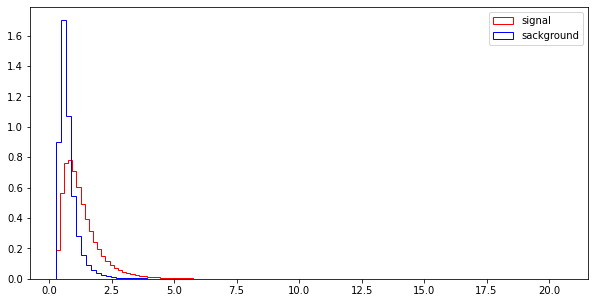

l_1_eta


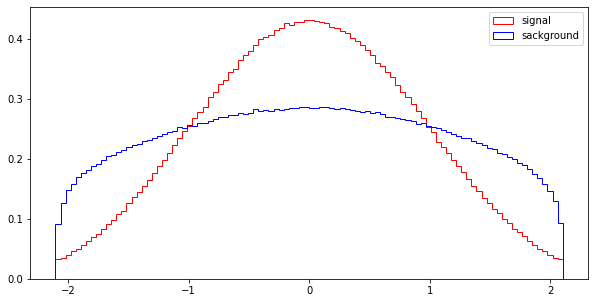

l_1_phi


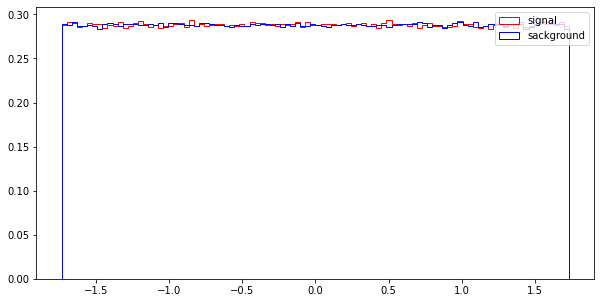

l_2_pT


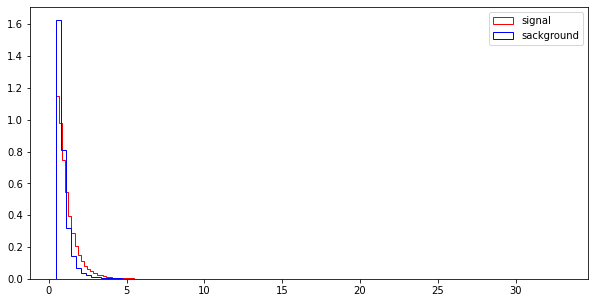

l_2_eta


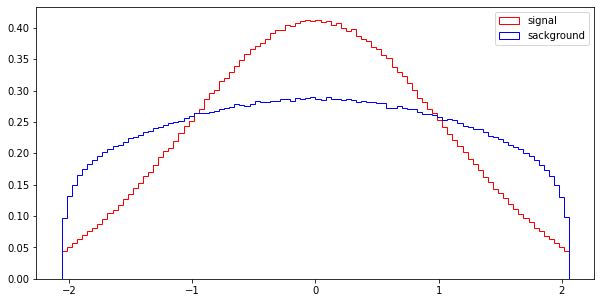

l_2_phi


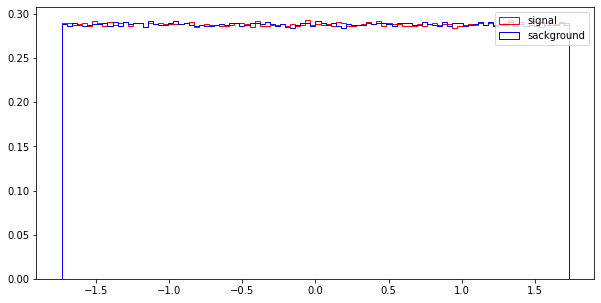

MET


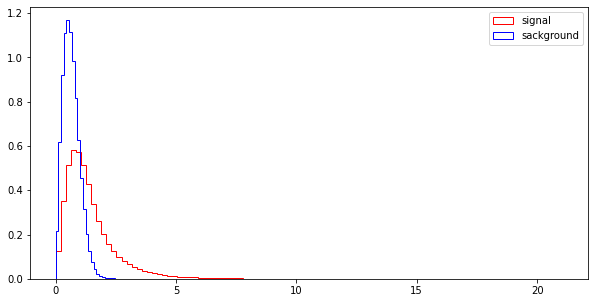

MET_phi


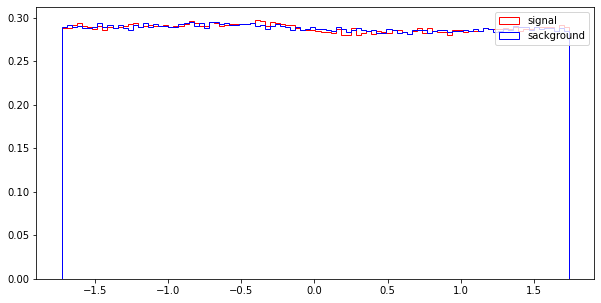

MET_rel


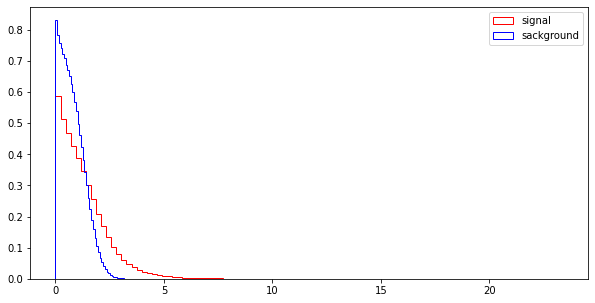

axial_MET


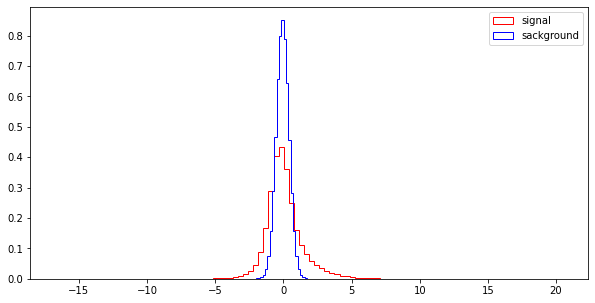

M_R


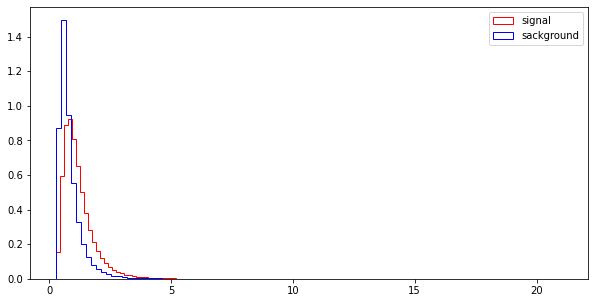

M_TR_2


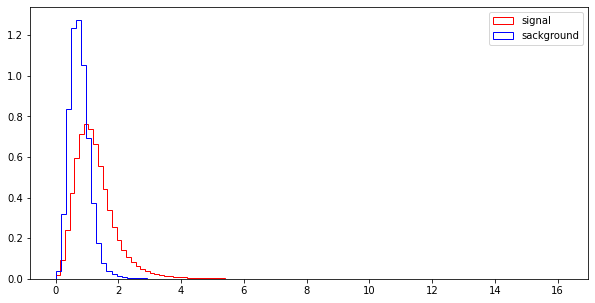

R


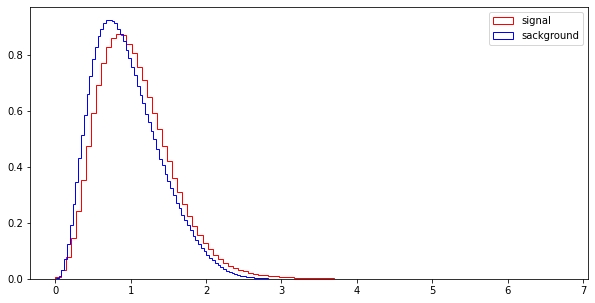

MT2


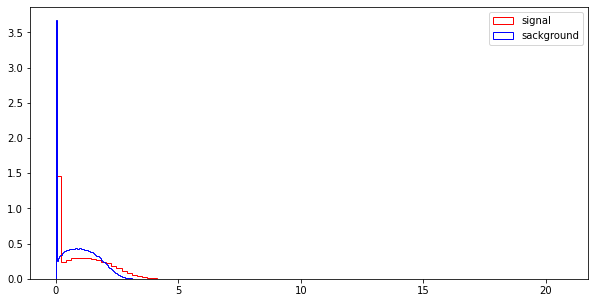

S_R


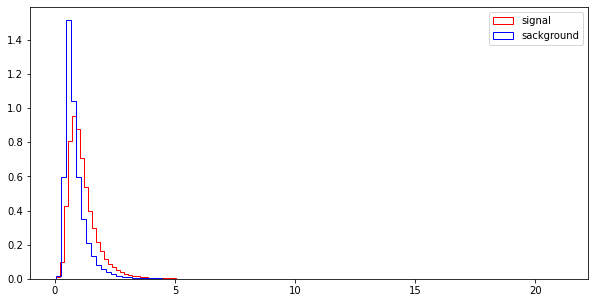

M_Delta_R


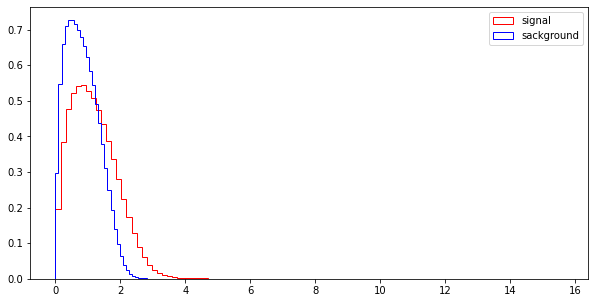

dPhi_r_b


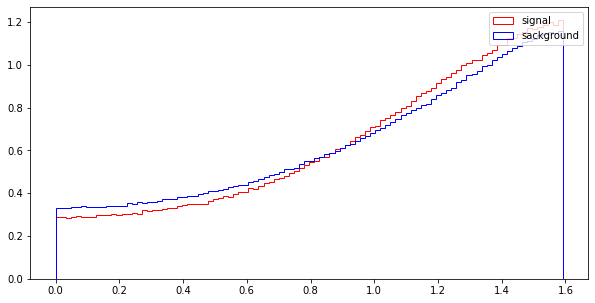

cos_theta_r1


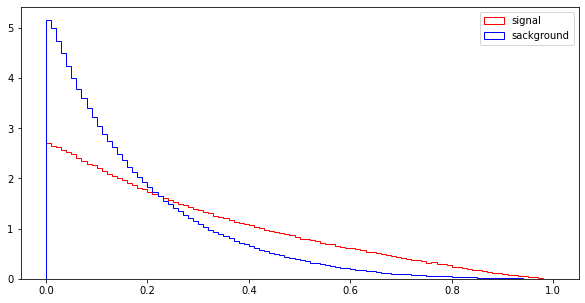

In [49]:
for var in VarNames[1:]:
    print(var)
    plt.figure(figsize=(10,5))
    plt.hist(np.array(df_sig[var]),bins=100,histtype="step", color="red",label="signal",
             density=True,
             stacked=True)
    plt.hist(np.array(df_bkg[var]),bins=100,histtype="step", color="blue", label="sackground",
             density=True,
             stacked=True)
    plt.legend(loc='upper right')
    plt.show()

In [125]:
l_1_pT_items = {'item':'l_1_pT', 'crit': crit_1, 'range': makerange(.5, 1.5, .05)}
l_1_eta_items = {'item':'l_1_eta', 'crit': crit_4, 'range': makerange(.5, 1, .1)}
l_2_pT_items = {'item':'l_2_pT', 'crit': crit_1, 'range': makerange(.5, 1.5, .05)}
l_2_eta_items = {'item':'l_2_eta', 'crit': crit_4, 'range': makerange(0, 2, .1)}
MET_items = {'item':'MET', 'crit': crit_1, 'range': makerange(.5, 1.5, .05)}
MET_rel_items = {'item':'MET_rel', 'crit': crit_1, 'range': makerange(1, 2, .05)}
axial_MET_items = {'item':'axial_MET', 'crit': crit_3, 'range': makerange(.5, 1.1, .05)}
M_R_items = {'item':'M_R', 'crit': crit_1, 'range': makerange(.5, 1.1, .05)}
M_TR_2_items = {'item':'M_TR_2', 'crit': crit_1, 'range': makerange(.6, 1.3, .05)}
R_items = {'item':'R', 'crit': crit_1, 'range': makerange(.7, 1.2, .01)}
MT2_items = {'item':'MT2', 'crit': crit_1, 'range': makerange(1.5, 2.5, .01)}
S_R_items = {'item':'S_R', 'crit': crit_1, 'range': makerange(.5, 1.5, .01)}
M_Delta_R_items = {'item':'M_Delta_R', 'crit': crit_1, 'range': makerange(1, 2, .01)}
dPhi_r_b_items = {'item':'dPhi_r_b', 'crit': crit_1, 'range': makerange(0, 1.6, .1)}
cos_theta_r1_items = {'item':'cos_theta_r1', 'crit': crit_1, 'range': makerange(.2, .4, .05)}
test_these = [l_1_pT_items, l_1_eta_items, l_2_pT_items, l_2_eta_items, MET_items, MET_rel_items, axial_MET_items, M_R_items, M_TR_2_items, R_items, MT2_items, S_R_items, M_Delta_R_items, dPhi_r_b_items, cos_theta_r1_items]

In [126]:
def testall(data, testlist):
    xclist = list()
    etlist = list()
    eblist = list()
    for t in testlist:
        print(t['item'])
        tempchart = ChartTry(data, t['item'], t['crit'], t['range'])
        plt.plot(tempchart[0], tempchart[1])
        plt.show()
        print('x(c): '+str(tempchart[0][tempchart[1].index(max(tempchart[1]))]))
        xclist.append(tempchart[0][tempchart[1].index(max(tempchart[1]))])
        print('e(t): '+str(max(tempchart[1])))
        etlist.append(max(tempchart[1]))
        print('e(b): '+str(1-max(tempchart[1])))
        eblist.append(1-max(tempchart[1]))
        print('===')
    return [xclist, etlist, eblist]

In [133]:
vvtest = [MET_items, dPhi_r_b_items, cos_theta_r1_items, R_items]

In [132]:
dfg.columns

Index(['signal', 'MET', 'MET_phi', 'MET_rel', 'axial_MET', 'M_R', 'M_TR_2',
       'R', 'MT2', 'S_R', 'M_Delta_R', 'dPhi_r_b', 'cos_theta_r1'],
      dtype='object')

MET


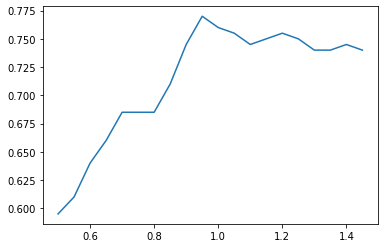

x(c): 0.9500000000000004
e(t): 0.77
e(b): 0.22999999999999998
===
dPhi_r_b


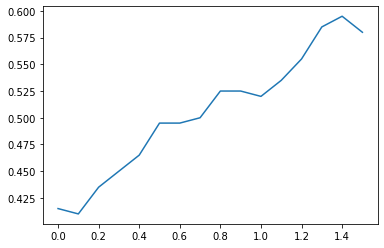

x(c): 1.4000000000000001
e(t): 0.595
e(b): 0.405
===
cos_theta_r1


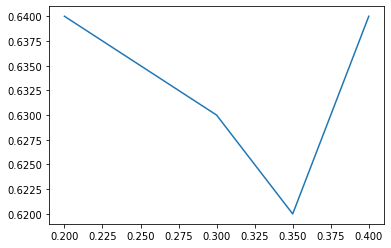

x(c): 0.2
e(t): 0.64
e(b): 0.36
===
R


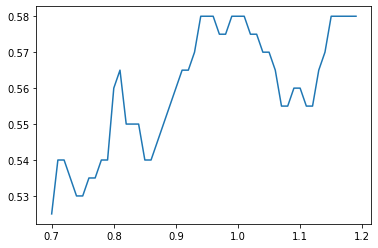

x(c): 0.9400000000000002
e(t): 0.58
e(b): 0.42000000000000004
===


In [141]:
vvv = testall(dfg, vvtest)

In [142]:
vvv

[[0.9500000000000004, 1.4000000000000001, 0.2, 0.9400000000000002],
 [0.77, 0.595, 0.64, 0.58],
 [0.22999999999999998, 0.405, 0.36, 0.42000000000000004]]

In [111]:
print('x(c): '+str(teststuff[0][teststuff[1].index(max(teststuff[1]))]))
print('e(s): '+str(max(teststuff[1])))
print('e(b): '+str(1-max(teststuff[1])))

x(c): 0.8000000000000006
e(s): 0.5836204
e(b): 0.41637959999999996


In [82]:
teststuff = ChartTry(df, 'l_1_eta', crit_4, makerange(-2, 2, .1))

In [100]:
l_1_pT_items

{'item': 'l_1_pT'}

In [50]:
#part a
#l_1_pT: x < x(c) 2
#l_1_eta: |x| < x(c) 4
#l_1_phi:
#l_2_pT: 2
#l_2_eta: x > x(c) 1
#l_2_phi:
#MET: x > x(c) 1
#MET_phi:
#MET_rel: x > x(c) 1
#axial_MET: |x| > x(c) 3
#M_R: x > x(c) 1
#M_TR_2: x > x(c) 1
#R: x > x(c) 1
#MT2: x > x(c) 1
#S_R: x > x(c) 1
#M_Delta_R: x > x(c) 1
#dPhi_r_b: x > x(c) 1
#cos_theta_r1: x > x(c) 1

In [84]:
np.array(teststuff)

array([[-2.00000000e+00, -1.90000000e+00, -1.80000000e+00,
        -1.70000000e+00, -1.60000000e+00, -1.50000000e+00,
        -1.40000000e+00, -1.30000000e+00, -1.20000000e+00,
        -1.10000000e+00, -1.00000000e+00, -9.00000000e-01,
        -8.00000000e-01, -7.00000000e-01, -6.00000000e-01,
        -5.00000000e-01, -4.00000000e-01, -3.00000000e-01,
        -2.00000000e-01, -1.00000000e-01,  6.38378239e-16,
         1.00000000e-01,  2.00000000e-01,  3.00000000e-01,
         4.00000000e-01,  5.00000000e-01,  6.00000000e-01,
         7.00000000e-01,  8.00000000e-01,  9.00000000e-01,
         1.00000000e+00,  1.10000000e+00,  1.20000000e+00,
         1.30000000e+00,  1.40000000e+00,  1.50000000e+00,
         1.60000000e+00,  1.70000000e+00,  1.80000000e+00,
         1.90000000e+00],
       [ 5.42434600e-01,  5.42434600e-01,  5.42434600e-01,
         5.42434600e-01,  5.42434600e-01,  5.42434600e-01,
         5.42434600e-01,  5.42434600e-01,  5.42434600e-01,
         5.42434600e-01,  5.42

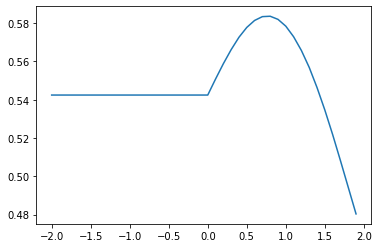

In [89]:
plt.plot(teststuff[0], teststuff[1])

In [94]:
teststuff[0][teststuff[1].index(max(teststuff[1]))],max(teststuff[1])

(0.8000000000000006, 0.5836204)

In [97]:
CheckRate(df[['signal','l_1_eta']], 'l_1_eta', crit_4, .8)

(0.5836204, 0.4163796)

In [123]:
import numpy as np

In [124]:
import matplotlib.pyplot as plt

In [138]:
#test_these = [l_1_pT_items, l_1_eta_items, l_2_pT_items, l_2_eta_items, MET_items, MET_rel_items, axial_MET_items, M_R_items, M_TR_2_items, R_items, MT2_items, S_R_items, M_Delta_R_items, dPhi_r_b_items, cos_theta_r1_items]
test_these_c = ['MET', 'dPhi_r_b', 'cos_theta_r1', 'R']
E_s = [0.71, 0.58, 0.61, 0.50, 0.72, 0.63, 0.69, 0.65, 0.71, 0.55, 0.59]
E_b = [0.29, 0.42, 0.39, 0.50, 0.28, 0.37, 0.31, 0.35, 0.29, 0.45, 0.41]
N_s = [10, 100, 1000, 10000]
N_b = [100, 1000, 10000, 100000]

In [143]:
test_these_c
E_s = vvv[1]
E_b = vvv[2]
N_s = [10, 100, 1000, 10000]
N_b = [100, 1000, 10000, 100000]

## Selection

### Exercise 3

#### Part a
By looking at the signal/background distributions for each observable (e.g. $x$) determine which selection criteria would be optimal: 

1. $x > x_c$
2. $x < x_c$
3. $|x| > x_c$
4. $|x| < x_c$

where $x_c$ is value to be determined below.

#### Part b
Plot the True Positive Rate (TPR) (aka signal efficiency $\epsilon_S(x_c)$) and False Positive Rate (FPR) (aka background efficiency $\epsilon_B(x_c)$) as function of $x_c$ for applying the strategy in part a to each observable. 

#### Part c
Assume 3 different scenarios corresponding to different numbers of signal and background events expected in data:

1. Expect $N_S=10$, $N_B=100$.
1. Expect $N_S=100$, $N_B=1000$.
1. Expect $N_S=1000$, $N_B=10000$.
1. Expect $N_S=10000$, $N_B=100000$.

Plot the significance ($\sigma_{S'}$) for each observable as function of $x_c$ for each scenario, where 

$\sigma_{S'}= \frac{N'_S}{\sqrt{N'_S+N'_B}}$

and $N'_{S,B} = \epsilon_{S,B}(x_c) * N_{S,B}$.

In [219]:
def test_significance(elist, tested):
    o_s = list()
    N_sa = list()
    N_ba = list()
    E_s = elist[1]
    E_b = elist[2]
    N_s = [10, 100, 1000, 10000]
    N_b = [100, 1000, 10000, 100000]
    plt.figure(figsize=(25, 25), dpi=60)
    for q, e in enumerate(tested):
        templist = list()
        v = e
        Nsaa = list()
        Nsbb = list()
        oss = list()
        for t, n in enumerate(N_s):
            Nis = E_s[q]*n
            Nib = E_b[q]*N_b[t]
            templist.append(Nis/(np.sqrt(Nis+Nib)))
            #Nsbb.append(Nib)
            #Nsaa.append(Nis)
            #oss.append(Nis/(np.sqrt(Nis+Nib)))
        #N_sa.append(Nsaa)
        #N_ba.append(Nsbb)
        #o_s.append(oss)
        plt.scatter([1, 2, 3, 4], templist)
        for c, t in enumerate(templist):
            plt.text([1, 2, 3, 4][c], t, v)
    col = list()
    for t, n in enumerate(N_s):
        print('senario '+str(t))
        row = list()
        Nsaa = list()
        Nsbb = list()
        oss = list()
        for q, e in enumerate(tested):
            Nis = E_s[q]*n
            Nib = E_b[q]*N_b[t]
            print(str(e)+' significance: '+str(Nis/(np.sqrt(Nis+Nib))))
            row.append(Nis/(np.sqrt(Nis+Nib)))
            Nsbb.append(Nib)
            Nsaa.append(Nis)
            oss.append(Nis/(np.sqrt(Nis+Nib)))
        col.append(row)
        N_sa.append(Nsaa)
        N_ba.append(Nsbb)
        o_s.append(oss)
        print('=======')
    full = list()
    for n, c in enumerate(tested):
        temp = list()
        temp.append(E_s[n])
        temp.append(E_b[n])
        for t in range(len(N_sa)):
            temp.append(N_sa[t][n])
            temp.append(N_ba[t][n])
            temp.append(o_s[t][n])
        full.append(temp)
    return pd.DataFrame(full, tested, columns = ['e_s', 'e_b', "N's_1", "N'b_1", "o's_1", "N's_2", "N'b_2", "o's_2", "N's_3", "N'b_3", "o's_3", "N's_4", "N'b_4", "o's_4"])

senario 0
MET significance: 1.3897015356925346
dPhi_r_b significance: 0.8730198261163657
cos_theta_r1 significance: 0.982872186934322
R significance: 0.838907438503539
senario 1
MET significance: 4.394622120622192
dPhi_r_b significance: 2.7607310930118665
cos_theta_r1 significance: 3.1081147595432452
R significance: 2.6528582517288193
senario 2
MET significance: 13.897015356925346
dPhi_r_b significance: 8.73019826116366
cos_theta_r1 significance: 9.82872186934322
R significance: 8.38907438503539
senario 3
MET significance: 43.94622120622192
dPhi_r_b significance: 27.60731093011867
cos_theta_r1 significance: 31.08114759543245
R significance: 26.528582517288196


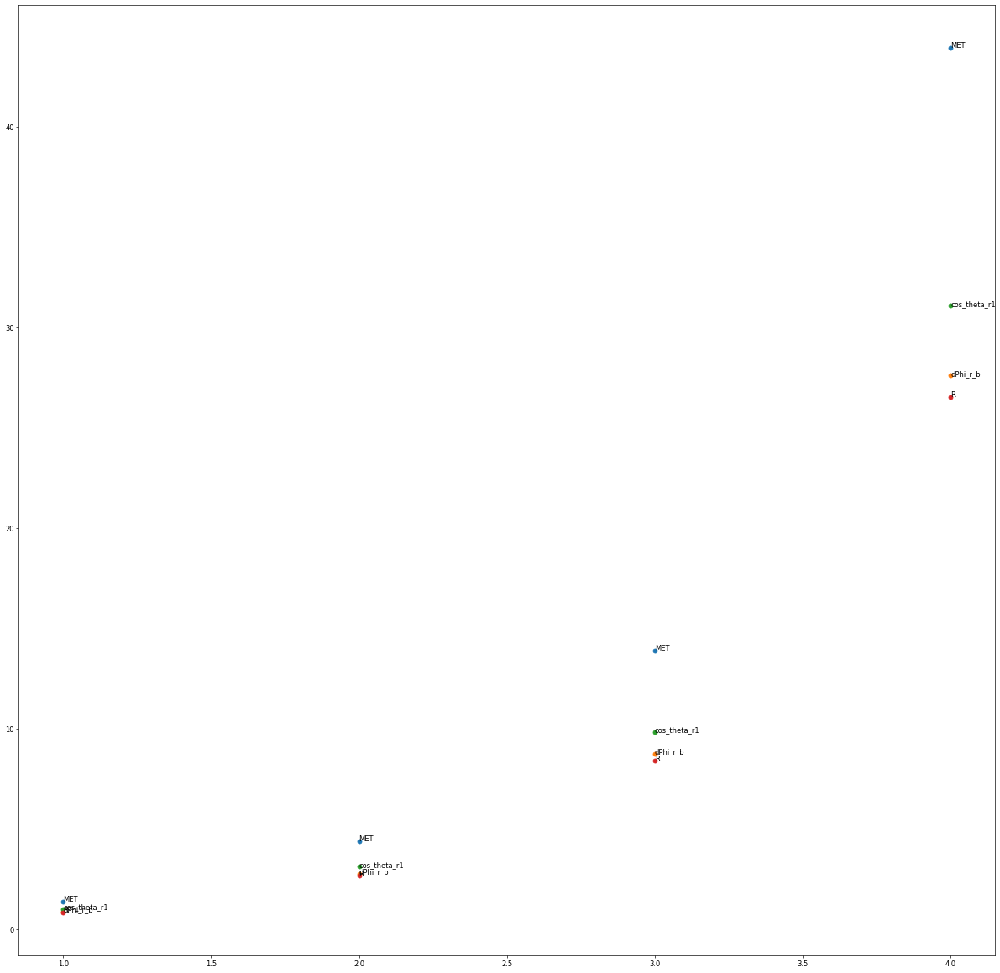

In [224]:
tttt = test_significance(vvv, test_these_c)

In [231]:
tttt

,e_s,e_b,N's_1,N'b_1,o's_1,N's_2,N'b_2,o's_2,N's_3,N'b_3,o's_3,N's_4,N'b_4,o's_4
MET,0.770,0.230,7.70,23.0,1.389702,77.0,230.0,4.394622,770.0,2300.0,13.897015,7700.0,23000.0,43.946221
dPhi_r_b,0.595,0.405,5.95,40.5,0.873020,59.5,405.0,2.760731,595.0,4050.0,8.730198,5950.0,40500.0,27.607311
cos_theta_r1,0.640,0.360,6.40,36.0,0.982872,64.0,360.0,3.108115,640.0,3600.0,9.828722,6400.0,36000.0,31.081148
R,0.580,0.420,5.80,42.0,0.838907,58.0,420.0,2.652858,580.0,4200.0,8.389074,5800.0,42000.0,26.528583


In [233]:
g = tttt.transpose()
g['MET']

e_s          0.770000
e_b          0.230000
N's_1        7.700000
N'b_1       23.000000
o's_1        1.389702
N's_2       77.000000
N'b_2      230.000000
o's_2        4.394622
N's_3      770.000000
N'b_3     2300.000000
o's_3       13.897015
N's_4     7700.000000
N'b_4    23000.000000
o's_4       43.946221
Name: MET, dtype: float64

In [202]:
vvv

[[0.9500000000000004, 1.4000000000000001, 0.2, 0.9400000000000002],
 [0.77, 0.595, 0.64, 0.58],
 [0.22999999999999998, 0.405, 0.36, 0.42000000000000004]]

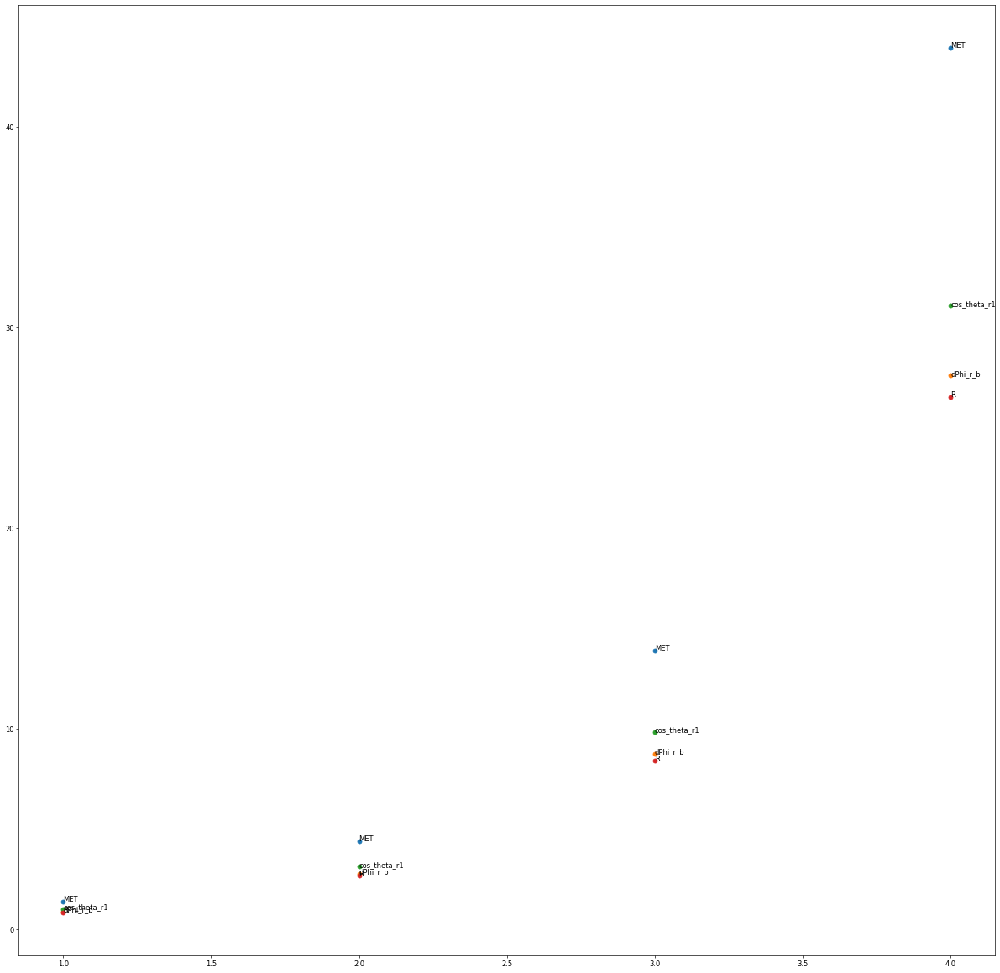

In [144]:
plt.figure(figsize=(25, 25), dpi=60)
for q, e in enumerate(test_these_c):
    templist = list()
    v = e
    for t, n in enumerate(N_s):
        Nis = E_s[q]*n
        Nib = E_b[q]*N_b[t]
        templist.append(Nis/(np.sqrt(Nis+Nib)))
    plt.scatter([1, 2, 3, 4], templist)
    for c, t in enumerate(templist):
        plt.text([1, 2, 3, 4][c], t, v)
    

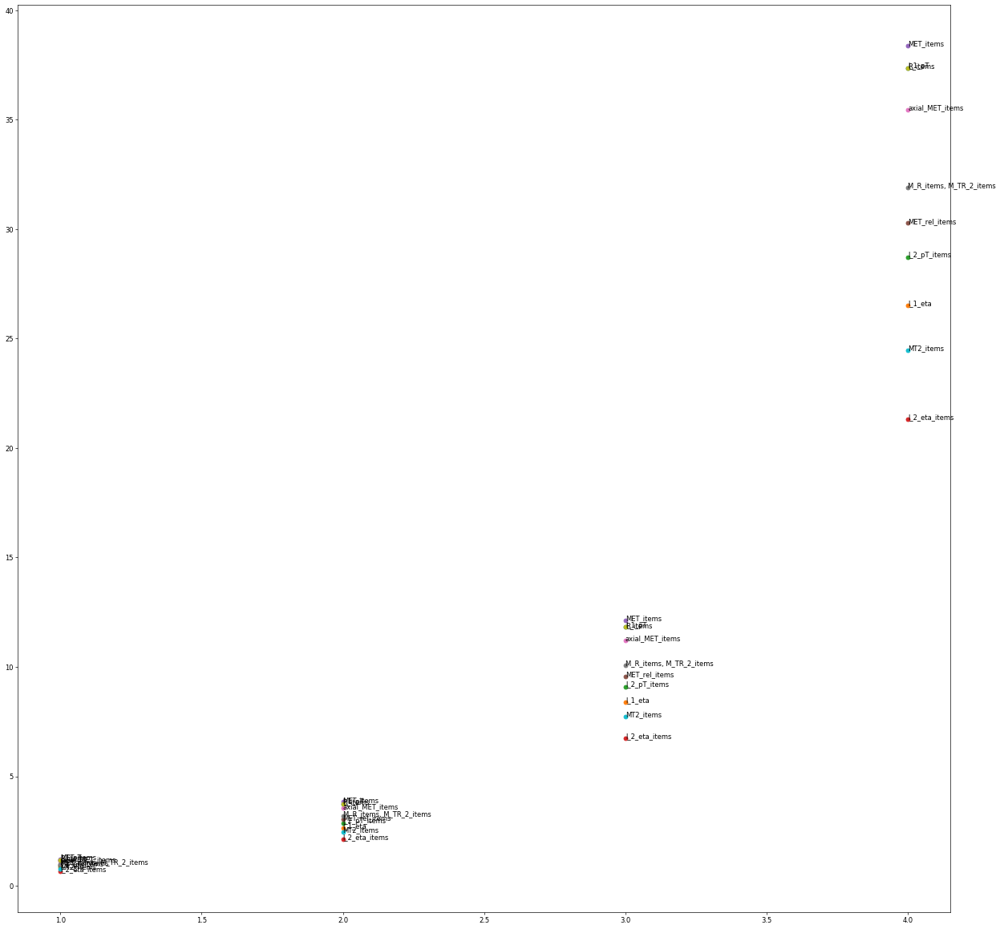

In [38]:
plt.figure(figsize=(25, 25), dpi=60)
for q, e in enumerate(test_these_c):
    templist = list()
    v = e
    for t, n in enumerate(N_s):
        Nis = E_s[q]*n
        Nib = E_b[q]*N_b[t]
        templist.append(Nis/(np.sqrt(Nis+Nib)))
    plt.scatter([1, 2, 3, 4], templist)
    for c, t in enumerate(templist):
        plt.text([1, 2, 3, 4][c], t, v)

In [145]:
col = list()
for t, n in enumerate(N_s):
    print('senario '+str(t))
    row = list()
    for q, e in enumerate(test_these_c):
        Nis = E_s[q]*n
        Nib = E_b[q]*N_b[t]
        print(str(e)+' significance: '+str(Nis/(np.sqrt(Nis+Nib))))
        row.append(Nis/(np.sqrt(Nis+Nib)))
    col.append(row)
    print('=======')

senario 0
MET significance: 1.3897015356925346
dPhi_r_b significance: 0.8730198261163657
cos_theta_r1 significance: 0.982872186934322
R significance: 0.838907438503539
senario 1
MET significance: 4.394622120622192
dPhi_r_b significance: 2.7607310930118665
cos_theta_r1 significance: 3.1081147595432452
R significance: 2.6528582517288193
senario 2
MET significance: 13.897015356925346
dPhi_r_b significance: 8.73019826116366
cos_theta_r1 significance: 9.82872186934322
R significance: 8.38907438503539
senario 3
MET significance: 43.94622120622192
dPhi_r_b significance: 27.60731093011867
cos_theta_r1 significance: 31.08114759543245
R significance: 26.528582517288196


In [50]:
col

[[1.181693230905026,
  0.838907438503539,
  0.9083256202334631,
  0.674199862463242,
  1.2135597524338355,
  0.9574070061993648,
  1.120803518777705,
  1.0089956834182328,
  1.181693230905026,
  0.773957299203321],
 [3.736842105263158,
  2.6528582517288193,
  2.8723778170228678,
  2.132007163556104,
  3.8376128944009875,
  3.02758678739294,
  3.5442919288688475,
  3.190724508879804,
  3.736842105263158,
  2.4474678771949168],
 [11.81693230905026,
  8.38907438503539,
  9.083256202334631,
  6.741998624632421,
  12.135597524338356,
  9.574070061993647,
  11.208035187777051,
  10.089956834182328,
  11.81693230905026,
  7.739572992033211],
 [37.36842105263158,
  26.5285825172882,
  28.723778170228677,
  21.320071635561042,
  38.37612894400988,
  30.2758678739294,
  35.44291928868847,
  31.90724508879804,
  37.36842105263158,
  24.47467877194916]]

In [45]:
#met, axial met, MR, axial met vs mtr2, mdelta R

In [46]:
#axial met vs mtr2, mdelta R

## Cut Flow

### Exercise 4

#### Part a
For each above scenario, choose a subset (minumum 3) of observables to use for selections, and values of $x_c$ based on your significance plots (part 3c). 

#### Part b
Create a "cut-flow" table for each scenario where you successively make the selections on each observable and tabulate $\epsilon_S$, $\epsilon_B$, $N'_S$, $N'_B$, and $\sigma_{S'}$.

#### Part c
In 3c above you computed the significance for each observable assuming to make no other selections on any other observable. If the variables are correlated, then this assumption can lead to non-optimial results when selecting on multiple variables. By looking at the correlation matrices and your answers to 4b, identify where this effect could be most detrimental to the significance. Attempt to correct the issue by applying the selection in one observable and then optimizing (part 3c) for a second observable. What happens if you change the order of your selection (make selection on second and optimize on first)?




In [ ]:
full = col
full.append()

In [55]:
table = col
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=test_these_c)))

l_1_pT,l_1_eta,l_2_pT_items,l_2_eta_items,MET_items,MET_rel_items,axial_MET_items,"M_R_items, M_TR_2_items",R_items,MT2_items
1.18169,0.838907,0.908326,0.6742,1.21356,0.957407,1.1208,1.009,1.18169,0.773957
3.73684,2.65286,2.87238,2.13201,3.83761,3.02759,3.54429,3.19072,3.73684,2.44747
11.8169,8.38907,9.08326,6.742,12.1356,9.57407,11.208,10.09,11.8169,7.73957
37.3684,26.5286,28.7238,21.3201,38.3761,30.2759,35.4429,31.9072,37.3684,24.4747
